<a href="https://colab.research.google.com/github/ericyang125/openpiv-python-gpu/blob/master/Openpiv_Python_Tutorial_Advanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Openpiv-python-gpu Advanced Tutorial


Use the following link to run this using GPUs from Google Colab.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ericyang125/openpiv-python-gpu/blob/master/Openpiv_Python_Tutorial_Advanced.ipynb)

Ensure that GPU acceleration is enabled in Google Colab: Runtime > Change runtime type.


## Introduction


This tutorial will demonstrate interactively how each of the parameters of the GPU function affects the output. The speed at which the GPU-accelerated algorithmn processes a large dataset is also demonstrated. Using GPU-acceleration can speed up processing by O(10):
> Dallas, C., Wu, M., Chou, V., Liberzon, A., & Sullivan, P. E. (2019). Graphical Processing Unit-Accelerated Open-Source Particle Image Velocimetry Software for High Performance Computing Systems. Journal of Fluids Engineering, 141(11).

The data used here are synthetic images generated from a slice of the Johns Hopkins turbulent channel database:
> Perlman, E., Burns, R., Li, Y., and Meneveau, C., 2007, “Data Exploration of Turbulence Simulations Using a Database Cluster,” ACM/IEEE Conference on Supercomputing (SC’07), Reno, NV, Nov. 10–16, p. 23.

The images are 0.8 MP, and up to 1000 pairs can be processed in this notebook. The output from the PIV function will be compared with the underlying velocity data.

This entire notebook will take ~5 minutes to run on default setting; most of  the time is required for package installation and external file downloads. Note that the first code block requires user input to authorize the Google Drive client to download the public data.

To interact with the tutorial, you only need to Authenticate provide client Authentication to Google, then run the code blocks while changing any parameters in the Colab forms.

To understand the PIV parameters, see the References section for mathematical foundations of PIV. In brief, for every iteration specified, the alogrithm estimates the velocity field by cross-correlation of square regions around the nodes of the PIV grid. The estimated velocity field is used to translate and deform the windows used in the next iteration, which results in a more accurate estimate. In between iterations, the estimated velocity field can be processed by smoothing and validation routines. Smaller windows allow for more local estimates of the velocity, at the risk of producing spurious vectors.

## User Input Required for Drive Authorization

In [1]:
#@title Google Drive client authorization
#@markdown Please authorize the client here.

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# folder id of the public data
image_dir_id = '1IuzZlz7DjjKHptILpuzRAFRUioiAiqaX'
vel_dir_id = '185O3NOtyl0rn5GTLUIYYEOVLuipZddjW'

# get the list of files on Drive
image_file_list = drive.ListFile({'q': "'{}' in parents and trashed=false".format(image_dir_id)}).GetList()
vel_file_list = drive.ListFile({'q': "'{}' in parents and trashed=false".format(vel_dir_id)}).GetList()

# sort the file list by title
image_file_list = sorted(image_file_list, key=lambda i: i['title'])
vel_file_list = sorted(vel_file_list, key=lambda i: i['title'])


## Install OpenPIV

In [2]:
# Uninstall the curren version of CUDA
!apt-get --purge remove cuda nvidia* libnvidia-*
!dpkg -l | grep cuda- | awk '{print $2}' | xargs -n1 dpkg --purge
!apt-get remove cuda-*
!apt autoremove
!apt-get update

# Install CUDA 10.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget https://developer.download.nvidia.com/compute/cuda/10.1/Prod/local_installers/cuda-repo-ubuntu1804-10-1-local-10.1.243-418.87.00_1.0-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-10-1-local-10.1.243-418.87.00_1.0-1_amd64.deb
!apt-key add /var/cuda-repo-10-1-local-10.1.243-418.87.00/7fa2af80.pub
!apt-get update
!apt-get -y install cuda-10-1

# check that GPU is connected and correct version of CUDA toolkit is installed. Should say CUDA Version 10.1
!nvidia-smi
!nvcc --version


Reading package lists... Done
Building dependency tree       
Reading state information... Done
Note, selecting 'nvidia-kernel-common-418-server' for glob 'nvidia*'
Note, selecting 'nvidia-325-updates' for glob 'nvidia*'
Note, selecting 'nvidia-346-updates' for glob 'nvidia*'
Note, selecting 'nvidia-driver-binary' for glob 'nvidia*'
Note, selecting 'nvidia-331-dev' for glob 'nvidia*'
Note, selecting 'nvidia-304-updates-dev' for glob 'nvidia*'
Note, selecting 'nvidia-compute-utils-418-server' for glob 'nvidia*'
Note, selecting 'nvidia-384-dev' for glob 'nvidia*'
Note, selecting 'nvidia-libopencl1-346-updates' for glob 'nvidia*'
Note, selecting 'nvidia-fs-prebuilt' for glob 'nvidia*'
Note, selecting 'nvidia-driver-440-server' for glob 'nvidia*'
Note, selecting 'nvidia-340-updates-uvm' for glob 'nvidia*'
Note, selecting 'nvidia-dkms-450-server' for glob 'nvidia*'
Note, selecting 'nvidia-kernel-common' for glob 'nvidia*'
Note, selecting 'nvidia-kernel-source-440-server' for glob 'nvidia*'


In [3]:
# Install PyCUDA.
!pip3 install pycuda

# Install scikit-CUDA.
!pip3 install scikit-CUDA

# Install other requirements which may already be fulfilled.
!pip3 install cython imageio numpy matplotlib setuptools progressbar2

# Clone the repo.
!git clone https://github.com/ericyang125/openpiv-python-gpu.git

# Install OpenPIV extensions.
!cd openpiv-python-gpu && python3 setup.py build_ext --inplace


  Using cached pycuda-2021.1.tar.gz (1.7 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached Mako-1.1.5-py2.py3-none-any.whl (75 kB)
     |████████████████████████████████| 63 kB 1.4 MB/s 
  Created wheel for pycuda: filename=pycuda-2021.1-cp37-cp37m-linux_x86_64.whl size=627014 sha256=5d92193ff42b57c6cbd315c5e866d09682c7bda2e336b2051a3abcf50db82507
  Stored in directory: /root/.cache/pip/wheels/c4/ef/49/dc6a5feb8d980b37c83d465ecab24949a6aa19458522a9e001
  Created wheel for pytools: filename=pytools-2021.2.8-py2.py3-none-any.whl size=60725 sha256=5333d7074e20a3a9769675d53ed8330356808285711a95eb3c0c81c97c411ccf
  Stored in directory: /root/.cache/pip/wheels/bd/2d/ef/0127a17bafa44971f11d05d0e38d7947144cf9e33313bf12a7
Successfully built pycuda pytools
  Using cached scikit_cuda-0.5.3-py2.py3-none-any.whl (114 kB)
Cloning into 'openpiv-python-gpu'...
remote: Enumerating objects: 6001, done.
remote:

## Download the data

In [4]:
#@title Dataset

import os
from progressbar import progressbar
from time import sleep
from glob import glob

#@markdown Choose the set of image pairs to download:
start_index = 0 #@param {type:"slider", min:0, max:1000, step:1}
end_index = 25 #@param {type:"slider", min:0, max:1000, step:1}
assert start_index < end_index, 'start_index must be smaller than end_index'

#@markdown Both image data and velocity data will be downloaded. The velocity data is for accuracy validation later on.

# resolution of the images/size of the fields
im_shape = (512, 6434 // 4)
num_images = 1000

# directory on the VM.
cwd = os.getcwd()

# get list of images already on drive
downloaded_image_list = sorted(glob('*.tiff'))
downloaded_vel_list = sorted(glob('*.npy'))

# download the files
download_list = [image_file_list[i] for i in range(2 * start_index, 2 * end_index) if image_file_list[i]['title'] not in downloaded_image_list]
print('Downloading {} image-data files:'.format(len(download_list))), sleep(0.25)
for file in progressbar(download_list):
    downloaded = drive.CreateFile({'id': file['id']})
    downloaded.GetContentFile(file['title'])

# download the velocity fields to validate
index_list = list(range(4)) + list(range(4 + start_index, 4 + end_index)) + list(range(4 + num_images + start_index, 4 + num_images + end_index))
download_list = [vel_file_list[i] for i in index_list if vel_file_list[i]['title'] not in downloaded_vel_list]
print('Downloading {} velocity-data files:'.format(len(download_list))), sleep(0.25)
for file in progressbar(download_list):
    downloaded = drive.CreateFile({'id': file['id']})
    downloaded.GetContentFile(file['title'])

# make file lists
frame_a_list = ['{}/jh_{:04d}_a.tiff'.format(cwd, i) for i in range(start_index, end_index)]
frame_b_list = ['{}/jh_{:04d}_b.tiff'.format(cwd, i) for i in range(start_index, end_index)]
u0_list = ['{}/u_{:04d}.npy'.format(cwd, i) for i in range(start_index, end_index)]
v0_list = ['{}/v_{:04d}.npy'.format(cwd, i) for i in range(start_index, end_index)]
index_bounds = (start_index, end_index)

print('Downloaded image pairs and data {} through {}.'.format(*index_bounds))


100% (50 of 50) |########################| Elapsed Time: 0:00:32 Time:  0:00:32


100% (54 of 54) |########################| Elapsed Time: 0:00:37 Time:  0:00:37


Downloaded image pairs and data 0 through 25.


## PIV Parameters

Here you can try changing the parameters and see how it affects the results.
Pay attention to what affects the accuracy of the results and the runtime.
- Try using a *window_size_iters* = (1, 2) and *min_window_size* = 16.
- Then try *window_size_iters* = (1, 2, 2) and *min_window_size* = 8.
- Try using only one iteration (use the largest window size), then using two iterations at the same window size.
- See if window deformation or smoothing improves the results.

Be warned that the smallest window size requires a good estimate of the velocity vectors from the previous steps.


In [5]:
#@title Main Parameters

#@markdown 2D array of integers with values 0 for the background, 1 for the flow-field. If the center of a window is on a 0 value the velocity is set to 0.
mask = None #@param ["None"] {type:"raw"}

#@markdown Number of iterations performed at each window size. You can enter a tuple, where the number of tuple indexes control the number of mesh refinements. For example (1, 2, 2) would perform 1 iteration at 4 * *min_window_size*, 2 iterations at 2 * *min_window_size* and 2 iterations at *min_window_size*.
window_size_iters = (1, 2, 2) #@param {type:"raw"}

#@markdown Length of the sides of the square deformation. Only supports multiples of 8.
min_window_size = 8 #@param [8, 16, 32] {type:"raw"}

#@markdown The ratio of overlap between adjacent windows (between 0 and 1). This is almost always left as 0.5. Too much overlap will result in the algorithm failing.
overlap_ratio = 0.5 #@param {type:"number"}

#@markdown Time delay separating the two frames. This can be left as 1 for this tutorial.
dt = 1 #@param {type:"number"}

#@markdown Whether to deform the windows by the velocity gradient at each iteration. This improves the results if there are large gradient fields.
deform = True #@param ["True", "False"] {type:"raw"}

#@markdown Whether to smooth the intermediate fields.
smooth = True #@param ["True", "False"] {type:"raw"}

#@markdown Number of iterations per validation cycle.
nb_validation_iter = 2 #@param {type:"number"}

#@markdown Method used for validation. Only the mean velocity method is implemented for now.
validation_method = "median_velocity" #@param ['s2n', 'median_velocity', 'mean_velocity', 'rms_velocity'] {type:"string"}

#@markdown With a first window size following the 1/4 rule, the 1st iteration can be trusted.
trust_1st_iter = True #@param ["True", "False"] {type:"raw"}



In [6]:
#@title Other Parameters
#@markdown These are more advanced parameters and can be ignored by beginners.

#@markdown Tolerance of the validation. The default value of 2 is fairly universal for median validation (Westerwheel, 1994).
s2n_tol = 1.25 #@param {type:"number"}

#@markdown Tolerance of the validation. The default value of 2 is fairly universal for median validation (Westerwheel, 1994).
val_tol = 2 #@param {type:"number"}

#@markdown The smoothing parameter to pass to Smoothn applied to the fields between iterations.
smoothing_par = 0.5 #@param {type:"number"}

#@markdown One of the following methods to estimate subpixel location of the peak:\n'centroid' [replaces default if correlation map is negative],\n'gaussian' [default if correlation map is positive],\n'parabolic'.
subpixel_method = 'gaussian' #@param ['gaussian'] {type:"string"}

#@markdown Whether the signal-to-noise ratio should be computed and returned. Setting this to False speeds up the computation significantly.
sig2noise = True #@param ["True", "False"] {type:"raw"}

#@markdown Defines the method of signal-to-noise-ratio measure. ['peak2peak' or 'peak2mean'].
sig2noise_method = 'peak2peak' #@param ['peak2peak'] {type:"string"}

#@markdown The half size of the region around the first correlation peak to ignore for finding the second peak.\n[default: 2]. Only used if sig2noise_method==peak2peak.
s2n_width = 2 #@param {type:"number"}

#@markdown The size of the 2D FFT in x-direction. The default of 2 x windows_a.shape[0] is recommended.
nfftx = None #@param {type:"raw"}


## Processing

In [7]:
#@title Batch size
#@markdown Choose the number of image pairs to process at once:
start_index = 0 #@param {type:"slider", min:0, max:1000, step:1}
end_index = 25 #@param {type:"slider", min:0, max:1000, step:1}

#@markdown Each image pair should take O(1) s on modern hardware.


In [8]:
import os
import sys
import numpy as np
import time
import imageio as io
from contextlib import redirect_stdout

# Get the number of fields to process.
start_index = max(index_bounds[0], start_index)
end_index = min(index_bounds[1], end_index)
num_outputs = end_index - start_index
index_range = (start_index, end_index)

# Add OpenPIV to the python path.
sys.path.append(os.path.join(os.getcwd(), 'openpiv-python-gpu/'))

# Import the GPU module and the tools module.
import openpiv.gpu_process as gpu_process
import openpiv.tools as tools

# The parameters are input as a dictionary for convenience
pars = {
    'mask': mask,
    'window_size_iters': window_size_iters,
    'min_window_size': min_window_size,
    'overlap_ratio': overlap_ratio,
    'dt': dt,
    'deform': deform,
    'smooth': smooth,
    'nb_validation_iter': nb_validation_iter,
    'validation_method': validation_method,
    'trust_1st_iter': trust_1st_iter,
    's2n_tol': s2n_tol,
    'median_tol': val_tol,
    'mean_tol': val_tol,
    'rms_tol': val_tol,
    'smoothing_par': smoothing_par,
    'subpixel_method': subpixel_method,
    'sig2noise': sig2noise,
    'sig2noise_method': sig2noise_method,
    's2n_width': s2n_width,
    'nfftx': nfftx
}

# Numpy arrays are created to store the velocity data.
spacing = min_window_size - overlap_ratio * min_window_size
m, n = gpu_process.get_field_shape(im_shape, min_window_size, spacing)  # shape of the final velocity field
s2n = np.empty((num_outputs, m, n))
u = np.empty_like(s2n)
v = np.empty_like(s2n)

# This is the main loop over the dataset
process_wall_time = 0
for i in progressbar(range(start_index, end_index), redirect_stout=True):

    # The images are loaded
    frame_a  = io.imread(frame_a_list[i])
    frame_b  = io.imread(frame_b_list[i])

    # The velocity fields are computed.
    start_time = time.time()
    with redirect_stdout(None):  # suppress printing to console to keep notebook clean
        x, y, u[i, :, :], v[i, :, :], mask_output, _ = gpu_process.gpu_piv(frame_a, frame_b, **pars)
    process_wall_time += time.time() - start_time

# The performance of the function is reported.
print('Computation time for {} image pairs was {:.3f} s.'.format(num_outputs, process_wall_time))
print('Average time per image pair was {:.3f} s.'.format(process_wall_time / num_outputs))

/usr/local/lib/python3.7/dist-packages/skcuda/cublas.py:284: UserWarning: creating CUBLAS context to get version number
  warnings.warn('creating CUBLAS context to get version number')
100% (25 of 25) |########################| Elapsed Time: 0:01:00 Time:  0:01:00


Computation time for 25 image pairs was 60.275 s.
Average time per image pair was 2.411 s.


## Results

By trying various parameters above, you will observe that the accuracy of only 1 iteration is quite low. Both deformation and smoothing improves the accuracy of the results. Using the fine mesh (8-pixel window size) requires both deformation and smoothing to work properly, but minimizes the error from 

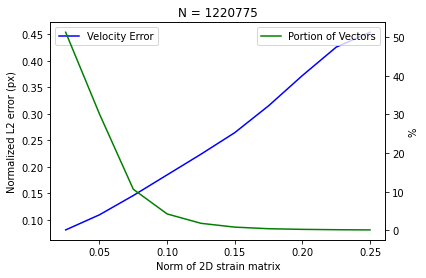

In [9]:
# This code block will estimate the accuracy of the outputs as a function of gradient magnitude.

import matplotlib.pyplot as plt
from scipy.interpolate import interp2d
from math import sqrt
%matplotlib inline

# trim edges
trim = 2
t = slice(trim, -trim)

# load the x and y coordinates
x0 = np.load('_x.npy')
y0 = np.load('_y.npy')

# create arrays to store the error values
gradient_mag = np.zeros((num_outputs, m - 2 * trim, n - 2 * trim))
vel_error_mag = np.zeros((num_outputs, m - 2 * trim, n - 2 * trim))

# The accuracy of the fields is evaluated
for i in range(*index_range):
    # load the original velocity field
    u0_ = np.load(u0_list[i])
    v0_ = np.load(v0_list[i])

    # create interpolants for the original data
    u0_interp = interp2d(x0[0, :], y0[:, 0], u0_)
    v0_interp = interp2d(x0[0, :], y0[:, 0], v0_)

    # interpolate the original data
    u0 = np.flip(u0_interp(x[0, :], y[:, 0]), axis=0)
    v0 = np.flip(v0_interp(x[0, :], y[:, 0]), axis=0)

    # compute error
    u_error = u[i, :, :] - u0
    v_error = v[i, :, :] - v0
    vel_error_mag[i, :, :] = np.linalg.norm(np.stack([u_error, v_error]), axis=0)[t, t]

    # compute gradients
    u_y, u_x = np.gradient(u0, spacing)
    v_y, v_x = np.gradient(v0, spacing)

    # compute norm of the gradient matrix
    gradient_mag[i] = np.linalg.norm(np.stack([u_x, u_y, v_x, v_y]), axis=0)[t, t]

# compute the histogram values
bins = np.linspace(0, 0.25, 11)
gradient_hist, hist_bins = np.histogram(gradient_mag, bins)

# get the error in each bin
vel_error_bins = np.zeros(gradient_hist.shape)
zero = np.zeros_like(gradient_mag)
for i in range(0, len(bins) - 1):
    if gradient_hist[i] > 0:
        vel_error_bins[i] = np.linalg.norm(np.where((gradient_mag > hist_bins[i]) * (gradient_mag <= hist_bins[i + 1]), vel_error_mag, zero)) / sqrt(gradient_hist[i])
    else:
        vel_error_bins[i] = 0

# Plot the error
fig1, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(bins[1:], vel_error_bins, 'b')
ax2.plot(bins[1:], gradient_hist / vel_error_mag.size * 100, 'g')

# format the plot
ax1.set_xlabel('Norm of 2D strain matrix')
ax1.set_ylabel('Normalized L2 error (px)')
ax2.set_ylabel('%')
ax1.legend(['Velocity Error'], loc='upper left')
ax2.legend(['Portion of Vectors'], loc='upper right')
ax1.set_title('N = {}'.format(vel_error_mag.size))

plt.show()
plt.close()


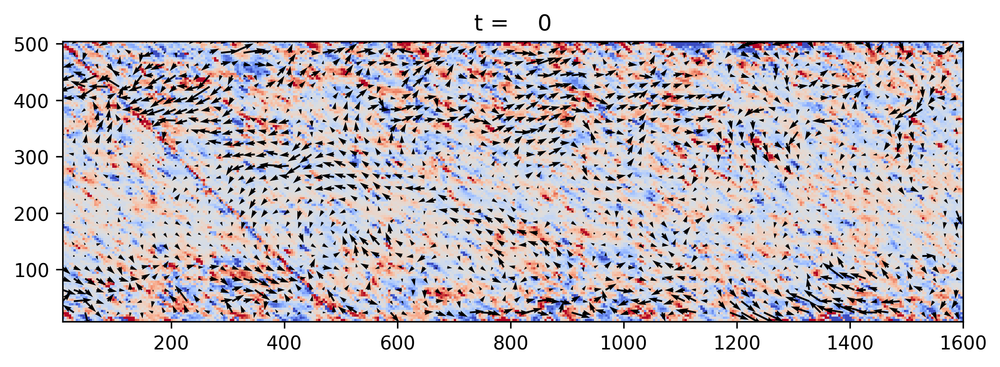

In [10]:
#@title Visualization
#@markdown The fluctuating velocities can be visualized as vectors.

import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import interp2d
from matplotlib import animation, RcParams
from IPython.display import HTML
import matplotlib.colors as colors
%matplotlib inline
matplotlib.rcParams['animation.embed_limit'] = 2**128

# choose the value to plot on coutour plot
#@markdown Choose the scalar quantity to plot as color:
color_var = "vorticity" #@param ['None', 'Reynolds Stress', 'vorticity'] {type:"string"}

#@markdown Choose the density of vectors to plot. The kth vector will be plotted.
k = 5 #@param {type:"number"}
s_i = slice(1, m - 1, k)
s_j = slice(1, n - 1, k)

# load the mean data
u_mean_ = np.load('_u.npy')
v_mean_ = np.load('_v.npy')

# create interpolants for the mean velocity
u0_interp = interp2d(x0[0, :], y0[:, 0], u_mean_)
v0_interp = interp2d(x0[0, :], y0[:, 0], v_mean_)

# interpolate the mean onto the output grid
u_mean = np.flip(u0_interp(x[0, :], y[:, 0]), axis=0)
v_mean = np.flip(v0_interp(x[0, :], y[:, 0]), axis=0)
# debug

up = (u - u_mean)
vp = (v - v_mean)
    
if color_var == 'Reynolds Stress':
    plot_var = up * vp
    hr = np.percentile(np.absolute(plot_var[:, 1:-1, 1:-1]), 99)

elif color_var == 'vorticity':
    u_y = -np.gradient(u, spacing, axis=0)
    v_x = np.gradient(v, spacing, axis=1)
    plot_var = v_x - u_y
    hr = np.percentile(np.absolute(plot_var[:, 1:-1, 1:-1]), 99)

else:
    plot_var = zeros_like(s2n)

# create plots
fig2, ax = plt.subplots(figsize=(7.5, 3.625), dpi=300, tight_layout=True)
txt_title = ax.set_title('')
ax.set_x_label = 'x'
ax.set_y_label = 'y'

# plot quiver
quad = ax.pcolormesh(x[1:-1, 1:-1], y[1:-1, 1:-1], plot_var[0, 1:-1, 1:-1], cmap='coolwarm', norm=colors.Normalize(vmin=-hr, vmax=hr))
q = ax.quiver(x[s_i, s_j], y[s_i, s_j], up[0, s_i, s_j], vp[0, s_i, s_j], scale=50, width=0.002)
plt.axis('scaled')

# define the function to draw the frames
def drawframe(i):
    # set the contour data
    quad.set_array(plot_var[i, 1:-1, 1:-1].ravel())

    # set the quiver data
    q.set_UVC(up[i, s_i, s_j], vp[i, s_i, s_j])
    txt_title.set_text('t = {0:4d}'.format(index_range[0] + i))

# animate the frames as html
anim = animation.FuncAnimation(fig2, drawframe, frames=num_outputs, interval=1000, blit=False)
HTML(anim.to_html5_video())


## Conclusions
Processing a large dataset using a GPU-accelerated algorithm has been shown.
Increasing the number of iterations results in better accuracy, as does decreasing the size of the final interrogation windows.
Both of these operations greatly increase computational work, which makes the GPU-acceleration especially valuable.


### Next steps
To learn how to dynamically mask static objects in data, see the tutorial on masking.
Ensure you know how the validation methods work.


The single-thread code only uses a fraction of the GPU's capability. Multiprocessing should be used to process alrge datasets.


## References
> Scarano F, Riethmuller ML (1999) Iterative multigrid approach in PIV image processing with discrete window offset. Exp Fluids 26:513–523
    
> Meunier, P., & Leweke, T. (2003). Analysis and treatment of errors due to high velocity gradients in particle image velocimetry. Experiments in fluids, 35(5), 408-421.
